In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile
zip_file_path = '/content/drive/MyDrive/archive.zip'  # Path to the zip file
extract_path = '/content/drive/My Drive/extracted_dataset'  # Path to extract to
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

<a id="2"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Libraries</p>

In [ ]:
import warnings
!pip install colorama==0.4.6
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style

* **[Table of Content](#0)**

<a id="3"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Dataset</p>

In [ ]:
Root_dir = "/content/drive/MyDrive/extracted_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "/content/drive/MyDrive/extracted_dataset/test"
Diseases_classes = os.listdir(train_dir)

* **[Table of Content](#0)**

<a id="4"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Data Preprocessing</p>

In [ ]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [ ]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)

    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)

    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])

    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])


print("\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Apple___Apple_scab: 2016 
The Number of Images in Apple___Black_rot: 1987 
The Number of Images in Apple___Cedar_apple_rust: 1760 
The Number of Images in Apple___healthy: 2008 
The Number of Images in Blueberry___healthy: 1816 
The Number of Images in Cherry_(including_sour)___Powdery_mildew: 1683 
The Number of Images in Cherry_(including_sour)___healthy: 1826 
The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 
The Number of Images in Corn_(maize)___Common_rust_: 1907 
The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908 
The Number of Images in Corn_(maize)___healthy: 1859 
The Number of Images in Grape___Black_rot: 1888 
The Number of Images in Grape___Esca_(Black_Measles): 1920 
The Number of Images in Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 
The Number of Images in Grape___healthy: 1692 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Peach___Bacterial_spo

* **[Table of Content](#0)**

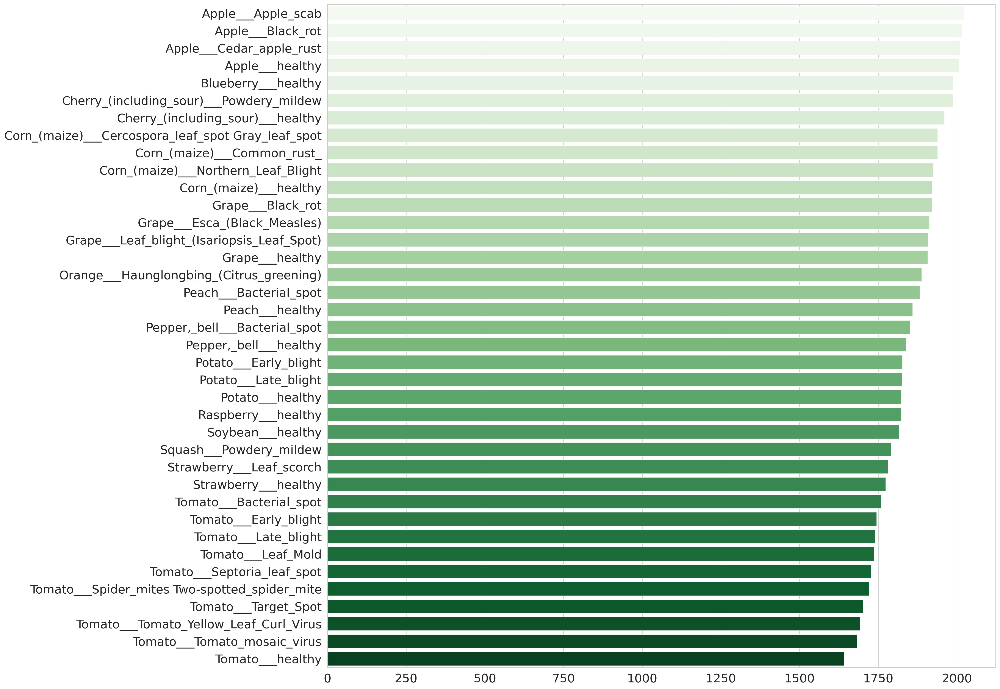

In [ ]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

In [ ]:
train

Dataset ImageFolder
    Number of datapoints: 70295
    Root location: /content/drive/MyDrive/extracted_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
    StandardTransform
Transform: ToTensor()

In [ ]:
train[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,

* **[Table of Content](#0)**

In [ ]:
train[7000]

(tensor([[[0.7137, 0.6824, 0.6549,  ..., 0.7020, 0.7137, 0.7373],
          [0.6863, 0.5608, 0.5294,  ..., 0.6784, 0.6902, 0.7098],
          [0.4235, 0.4471, 0.6902,  ..., 0.6941, 0.6980, 0.7176],
          ...,
          [0.2667, 0.3137, 0.3137,  ..., 0.2902, 0.3137, 0.3373],
          [0.2314, 0.2667, 0.2353,  ..., 0.3216, 0.3216, 0.3216],
          [0.1765, 0.2314, 0.2275,  ..., 0.3451, 0.3294, 0.3098]],
 
         [[0.6706, 0.6392, 0.6118,  ..., 0.6745, 0.6863, 0.7098],
          [0.6431, 0.5176, 0.4863,  ..., 0.6510, 0.6627, 0.6824],
          [0.3765, 0.4039, 0.6471,  ..., 0.6667, 0.6706, 0.6902],
          ...,
          [0.2588, 0.3059, 0.3059,  ..., 0.3294, 0.3490, 0.3725],
          [0.2235, 0.2588, 0.2275,  ..., 0.3608, 0.3569, 0.3569],
          [0.1686, 0.2235, 0.2196,  ..., 0.3843, 0.3647, 0.3451]],
 
         [[0.7020, 0.6706, 0.6353,  ..., 0.7451, 0.7569, 0.7804],
          [0.6745, 0.5490, 0.5176,  ..., 0.7216, 0.7333, 0.7529],
          [0.4157, 0.4353, 0.6784,  ...,

In [ ]:
train[70000]

(tensor([[[0.6471, 0.5020, 0.5529,  ..., 0.5882, 0.5059, 0.5922],
          [0.6667, 0.6706, 0.6471,  ..., 0.5412, 0.6118, 0.5490],
          [0.5294, 0.5098, 0.6196,  ..., 0.6157, 0.5804, 0.7216],
          ...,
          [0.3176, 0.2980, 0.3333,  ..., 0.3490, 0.4196, 0.5020],
          [0.3176, 0.3608, 0.4314,  ..., 0.4431, 0.4275, 0.4039],
          [0.3843, 0.3176, 0.3529,  ..., 0.4549, 0.4118, 0.3686]],
 
         [[0.6235, 0.4784, 0.5294,  ..., 0.5686, 0.4863, 0.5725],
          [0.6431, 0.6471, 0.6235,  ..., 0.5216, 0.5922, 0.5294],
          [0.5059, 0.4863, 0.5961,  ..., 0.5961, 0.5608, 0.7020],
          ...,
          [0.3137, 0.2941, 0.3294,  ..., 0.3529, 0.4235, 0.5059],
          [0.3137, 0.3569, 0.4275,  ..., 0.4471, 0.4314, 0.4078],
          [0.3804, 0.3137, 0.3490,  ..., 0.4588, 0.4157, 0.3725]],
 
         [[0.6392, 0.4941, 0.5451,  ..., 0.5922, 0.5098, 0.5961],
          [0.6588, 0.6627, 0.6392,  ..., 0.5451, 0.6157, 0.5529],
          [0.5216, 0.5020, 0.6118,  ...,

In [ ]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0



Label :Apple___Apple_scab(0)

Label :Apple___Black_rot(1)

Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___healthy(6)

Label :Corn_(maize)___Common_rust_(8)

Label :Tomato___Septoria_leaf_spot(32)

Label :Tomato___healthy(37)


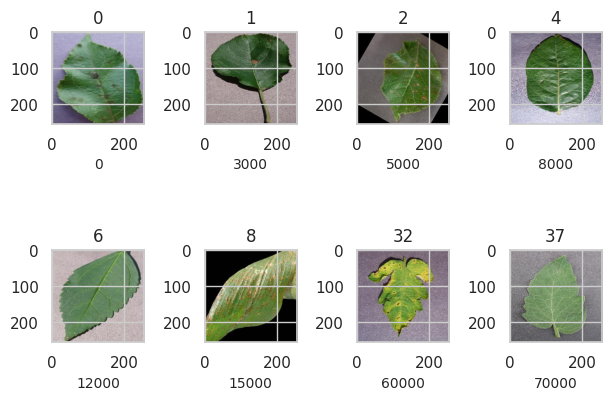

In [ ]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))


image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]

chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [ ]:
batch_size = 32

* **[Table of Content](#0)**

In [ ]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

* **[Table of Content](#0)**

<a id="5"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Device of Process</p>

In [ ]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [ ]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [ ]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

* **[Table of Content](#0)**

<a id="6"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Neural Network (CNN)</p>

In [ ]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
class ImageClassificationBase(nn.Module):

    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

* **[Table of Content](#0)**

In [ ]:
# resnet architecture
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)

        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))

    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

In [ ]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device)
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [ ]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [ ]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy.
    #The 1cycle policy anneals the learning rate from an initial learning rate to some
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate.
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))


    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation

        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

    return history


In [ ]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 47.7 s, sys: 5.53 s, total: 53.2 s
Wall time: 1min 42s


[{'val_loss': 3.6382009983062744, 'val_acc': 0.025227272883057594}]

In [ ]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [40]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader,
                             grad_clip=grad_clip,
                             weight_decay=weight_decay,
                             opt_func=optims)

Epoch [0], train_loss: 0.2768, val_loss: 0.8320, val_acc: 0.7550
Epoch [1], train_loss: 0.2973, val_loss: 0.6271, val_acc: 0.8107
Epoch [2], train_loss: 0.1847, val_loss: 0.1542, val_acc: 0.9481
Epoch [3], train_loss: 0.0865, val_loss: 0.0593, val_acc: 0.9819
Epoch [4], train_loss: 0.0235, val_loss: 0.0235, val_acc: 0.9928
CPU times: user 34min 40s, sys: 33min 34s, total: 1h 8min 14s
Wall time: 1h 21min 32s


* **[Table of Content](#0)**

<a id="7"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Result</p>

In [41]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

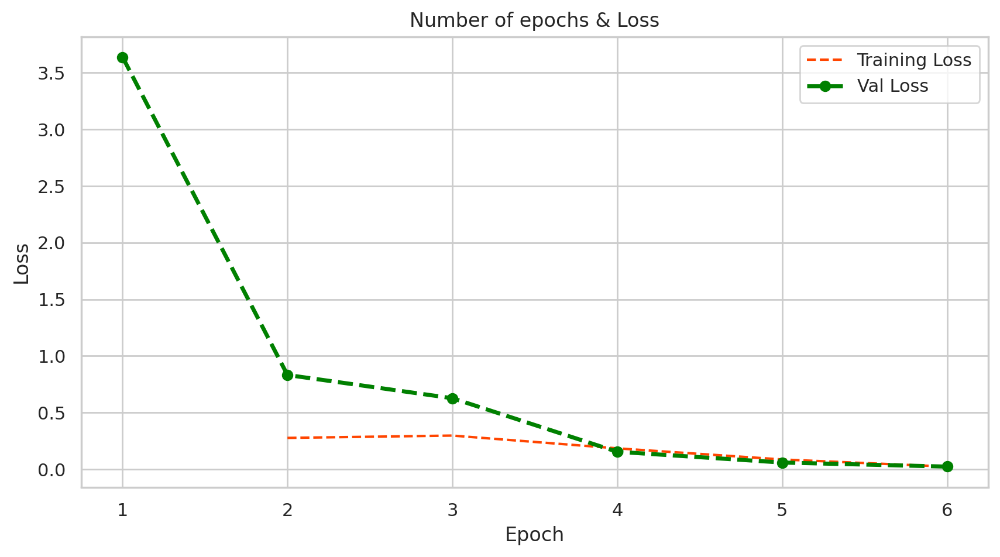

In [42]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

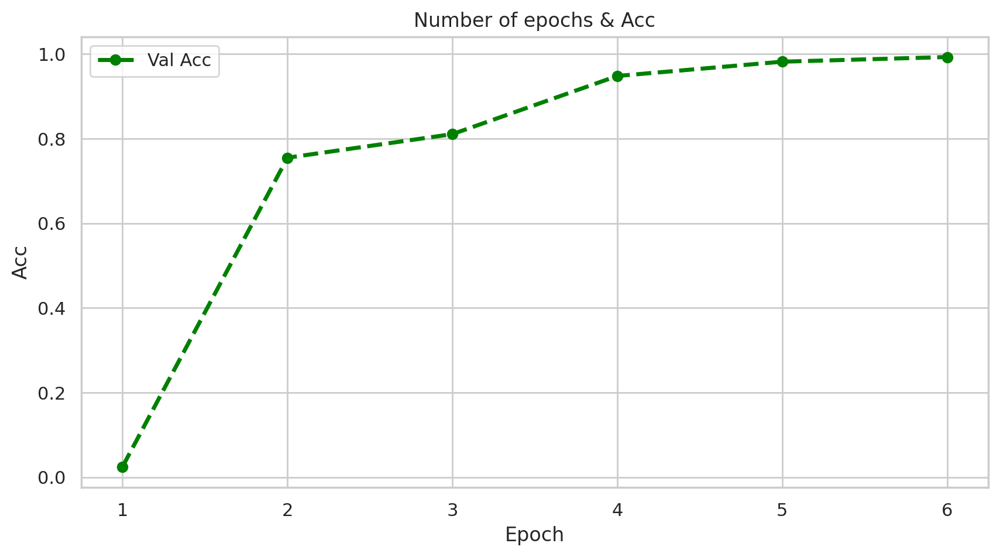

In [43]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

In [44]:
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['AppleCedarRust1.JPG', 'AppleCedarRust2.JPG', 'AppleCedarRust3.JPG', 'AppleCedarRust4.JPG', 'AppleScab1.JPG', 'AppleScab2.JPG', 'AppleScab3.JPG', 'CornCommonRust1.JPG', 'CornCommonRust2.JPG', 'CornCommonRust3.JPG', 'PotatoEarlyBlight1.JPG', 'PotatoEarlyBlight2.JPG', 'PotatoEarlyBlight3.JPG', 'PotatoEarlyBlight4.JPG', 'PotatoEarlyBlight5.JPG', 'PotatoHealthy1.JPG', 'PotatoHealthy2.JPG', 'TomatoEarlyBlight1.JPG', 'TomatoEarlyBlight2.JPG', 'TomatoEarlyBlight3.JPG', 'TomatoEarlyBlight4.JPG', 'TomatoEarlyBlight5.JPG', 'TomatoEarlyBlight6.JPG', 'TomatoHealthy1.JPG', 'TomatoHealthy2.JPG', 'TomatoHealthy3.JPG', 'TomatoHealthy4.JPG', 'TomatoYellowCurlVirus1.JPG', 'TomatoYellowCurlVirus2.JPG', 'TomatoYellowCurlVirus3.JPG', 'TomatoYellowCurlVirus4.JPG', 'TomatoYellowCurlVirus5.JPG', 'TomatoYellowCurlVirus6.JPG']
33


In [45]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]


Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust


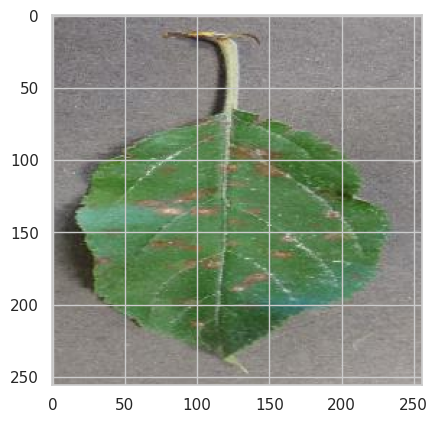

In [46]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))


Label: AppleScab2.JPG , Predicted: Apple___Apple_scab


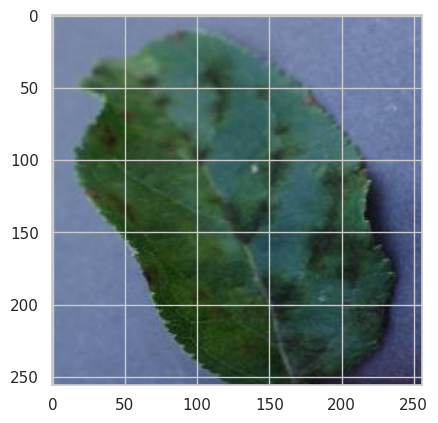

In [47]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_


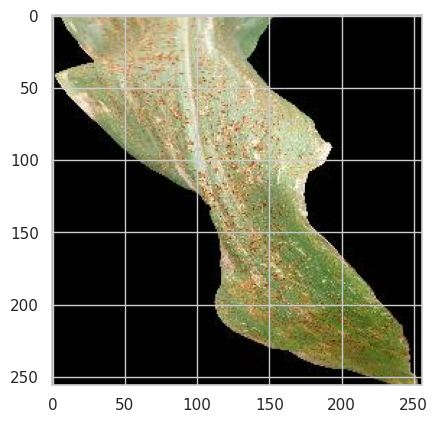

In [48]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: PotatoHealthy2.JPG , Predicted: Potato___healthy


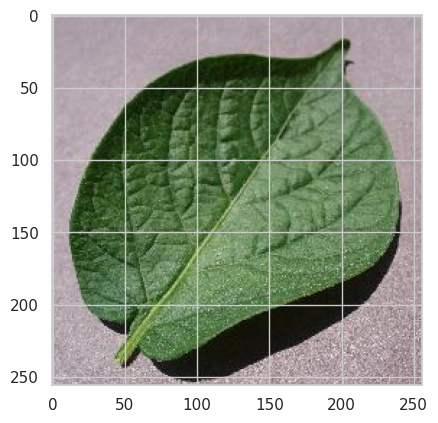

In [49]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))


Label: TomatoHealthy4.JPG , Predicted: Tomato___healthy


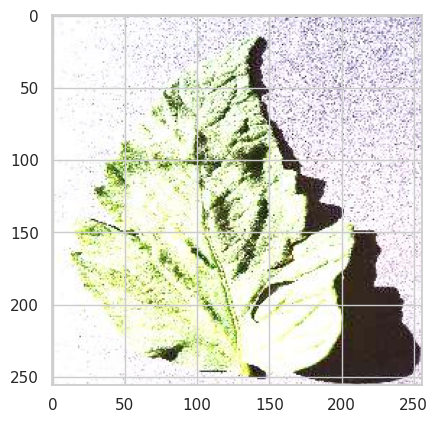

In [50]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[26], ', Predicted:', predict_image(img, model))

In [51]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust3.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust4.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleScab1.JPG , Predicted: Apple___Apple_scab

Label: AppleScab2.JPG , Predicted: Apple___Apple_scab

Label: AppleScab3.JPG , Predicted: Apple___Apple_scab

Label: CornCommonRust1.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust2.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_

Label: PotatoEarlyBlight1.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight2.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight3.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight4.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight5.JPG , Predicted: Potato___Early_blight

Label: PotatoHealthy1.JPG , Predi